<a href="https://colab.research.google.com/github/JozefV99/Master-Thesis/blob/main/HIGH_COMPLEXITY_ANNOTATIONS_GENERATION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **IMPORT HIGH COMPLEXITY IMAGES:**

In [ ]:
# IMPORT:

import os
import shutil
import zipfile
from google.colab import drive
from PIL import Image

# Mount Google Drive
drive.mount('/content/gdrive')

def extract_images_to_target(source_folder, target_folder):
    if not os.path.exists(target_folder):
        os.makedirs(target_folder)

    for zip_filename in os.listdir(source_folder):
        if zip_filename.endswith('.zip'):
            zip_path = os.path.join(source_folder, zip_filename)
            with zipfile.ZipFile(zip_path, 'r') as zip_file:
                # Extract the zip file into a temporary directory
                temp_dir = os.path.join(target_folder, "temp")
                os.makedirs(temp_dir, exist_ok=True)
                zip_file.extractall(temp_dir)
                print(f"Extracted {zip_filename} into {temp_dir}")

                # Move all images from the temporary directory to the target folder
                for root, dirs, files in os.walk(temp_dir):
                    for file_name in files:
                        if file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                            full_file_path = os.path.join(root, file_name)
                            shutil.move(full_file_path, os.path.join(target_folder, file_name))

                # Clean up the temporary directory
                shutil.rmtree(temp_dir)
                print(f"Cleaned up {temp_dir}")

# Specify the source and target directories
source_folder = "/content/gdrive/My Drive/Colab Notebooks/Data/HIGH COMPLEXITY"
target_folder = '/content/Images'

# Extract and organize files from ZIP archives
extract_images_to_target(source_folder, target_folder)

# Print final directory structure for verification
for root, dirs, files in os.walk(target_folder, topdown=True):
    for file in files:
        print(f"File: {os.path.join(root, file)}")

Streaming output truncated to the last 5000 lines.
File: /content/Images/D4332268_7144.png
File: /content/Images/D1100844_8417.png
File: /content/Images/D1899542_1432.png
File: /content/Images/D4332268_1166.png
File: /content/Images/D1612695_5393.png
File: /content/Images/D1612695_1747.png
File: /content/Images/D1100844_1600.png
File: /content/Images/D1612695_2392.png
File: /content/Images/D4332268_421.png
File: /content/Images/D1100844_9690.png
File: /content/Images/D1899542_3308.png
File: /content/Images/D1098590_3001.png
File: /content/Images/D1612695_1639.png
File: /content/Images/D4332268_9113.png
File: /content/Images/D1899542_8962.png
File: /content/Images/D1100844_9668.png
File: /content/Images/D1899542_3623.png
File: /content/Images/D1100844_9057.png
File: /content/Images/D1098590_9489.png
File: /content/Images/D1100844_919.png
File: /content/Images/D4332268_6504.png
File: /content/Images/D1098590_7346.png
File: /content/Images/D4332268_3053.png
File: /content/Images/D4332268_

# **CONSTANT BOUNDING BOX INSPECTION (one picture):**

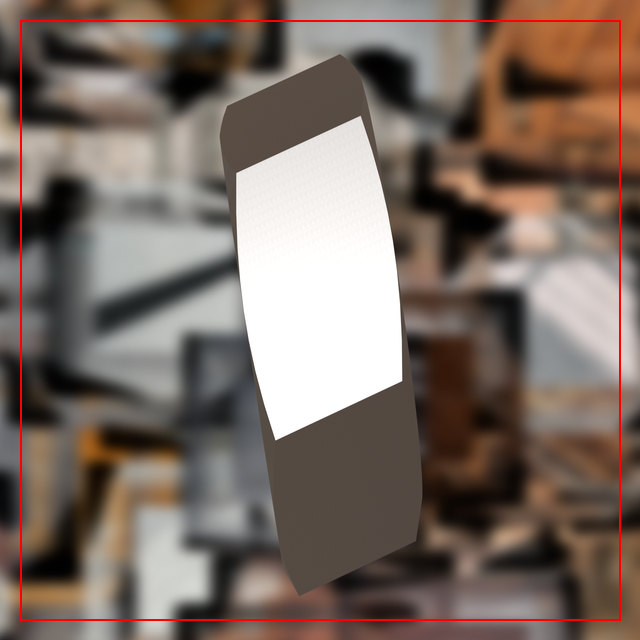

The bounding box is: (20, 20, 620, 620)


In [ ]:
from PIL import Image, ImageDraw
from IPython.display import display

def calculate_and_display_bounding_box(image_path, box_size):
    # Load the image
    with Image.open(image_path) as img:
        width, height = img.size

        # Calculate the central point
        center_x, center_y = width // 2, height // 2

        # Define the bounding box size
        half_box_size = box_size // 2

        # Calculate the top-left and bottom-right points of the bounding box
        top_left_x = max(center_x - half_box_size, 0)
        top_left_y = max(center_y - half_box_size, 0)
        bottom_right_x = min(center_x + half_box_size, width)
        bottom_right_y = min(center_y + half_box_size, height)

        # Create a draw object
        draw = ImageDraw.Draw(img)
        # Draw the rectangle
        draw.rectangle(((top_left_x, top_left_y), (bottom_right_x, bottom_right_y)), outline="red", width=2)

        # Display the image
        display(img)

    return top_left_x, top_left_y, bottom_right_x, bottom_right_y

# Example usage
image_path = '/content/Images/D1098590_0.png'  # Replace with your image path
box_size = 600  # Adjust this to the size of your object
bounding_box = calculate_and_display_bounding_box(image_path, box_size)
print(f"The bounding box is: {bounding_box}")

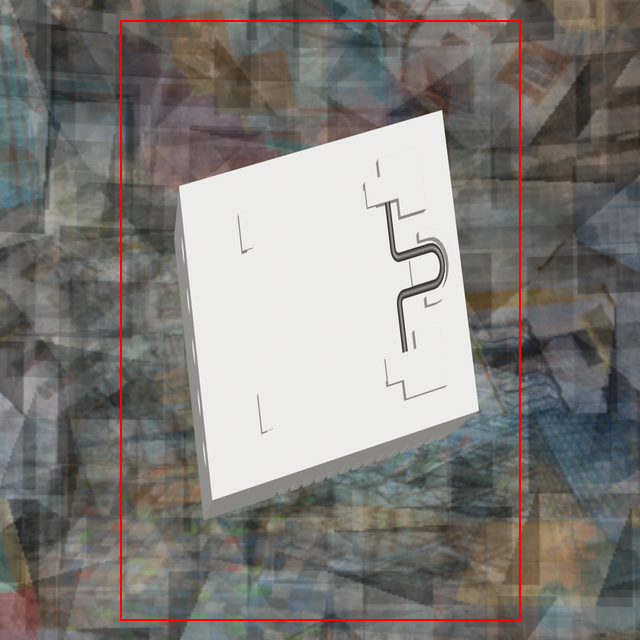

The bounding box is: (120, 20, 520, 620)


In [ ]:
from PIL import Image, ImageDraw
from IPython.display import display

def calculate_and_display_bounding_box(image_path, box_width, box_height):
    # Load the image
    with Image.open(image_path) as img:
        img_width, img_height = img.size

        # Calculate the central point
        center_x, center_y = img_width // 2, img_height // 2

        # Define the half sizes of the bounding box
        half_box_width = box_width // 2
        half_box_height = box_height // 2

        # Calculate the top-left and bottom-right points of the bounding box
        top_left_x = max(center_x - half_box_width, 0)
        top_left_y = max(center_y - half_box_height, 0)
        bottom_right_x = min(center_x + half_box_width, img_width)
        bottom_right_y = min(center_y + half_box_height, img_height)

        # Create a draw object
        draw = ImageDraw.Draw(img)
        # Draw the rectangle
        draw.rectangle(((top_left_x, top_left_y), (bottom_right_x, bottom_right_y)), outline="red", width=2)

        # Display the image
        display(img)

    return top_left_x, top_left_y, bottom_right_x, bottom_right_y

# Example usage
image_path = '/content/Images/D1899542_39.png'  # Replace with your image path
box_width = 400  # Adjust this to the width of your object
box_height = 600  # Adjust this to the height of your object
bounding_box = calculate_and_display_bounding_box(image_path, box_width, box_height)
print(f"The bounding box is: {bounding_box}")

# **PRODUCE CONSTANT BOUNDING BOXES FOR EACH IMAGE:**

In [ ]:
import os
from PIL import Image

# Input folder containing the images and the output folder for the annotations
image_folder = '/content/Images'  # Replace with your images folder path
annotation_folder = '/content/Annotations'  # Replace with your desired annotation folder path

# Make sure the annotation folder exists
os.makedirs(annotation_folder, exist_ok=True)

# Define the bounding box size
box_width = 400  # object width
box_height = 600  # object height

# YOLO class mapping
class_mapping = {
    'D1098590': 0,
    'D1100844': 1,
    'D1612695': 2,
    'D1899542': 3,
    'D4332268': 4,
}

# Function to calculate YOLO format bounding box
def calculate_yolo_format_bbox(img_width, img_height, box_width, box_height):
    dw = 1./img_width
    dh = 1./img_height
    x = (img_width / 2.0) * dw
    y = (img_height / 2.0) * dh
    w = box_width * dw
    h = box_height * dh
    return (x, y, w, h)

# Iterate over images and create YOLO format annotations
for image_file in os.listdir(image_folder):
    if image_file.endswith(('.png', '.jpg', '.jpeg')):  # Add or remove file extensions as needed
        class_id = class_mapping.get(image_file[:8])
        if class_id is not None:
            # Load the image to get its dimensions
            image_path = os.path.join(image_folder, image_file)
            with Image.open(image_path) as img:
                img_width, img_height = img.size

            # Calculate YOLO bounding box
            yolo_bbox = calculate_yolo_format_bbox(img_width, img_height, box_width, box_height)

            # Create annotation in YOLO format
            yolo_annotation = f"{class_id} {' '.join([str(coordinate) for coordinate in yolo_bbox])}\n"

            # Save the annotation to a text file with the same name as the image
            annotation_file = os.path.splitext(image_file)[0] + '.txt'
            annotation_path = os.path.join(annotation_folder, annotation_file)
            with open(annotation_path, 'w') as file:
                file.write(yolo_annotation)

print(f"YOLO format annotations have been created in {annotation_folder}")

YOLO format annotations have been created in /content/Annotations


# **VISUALIZE NEWLY CREATED BOUNDING BOXES:**

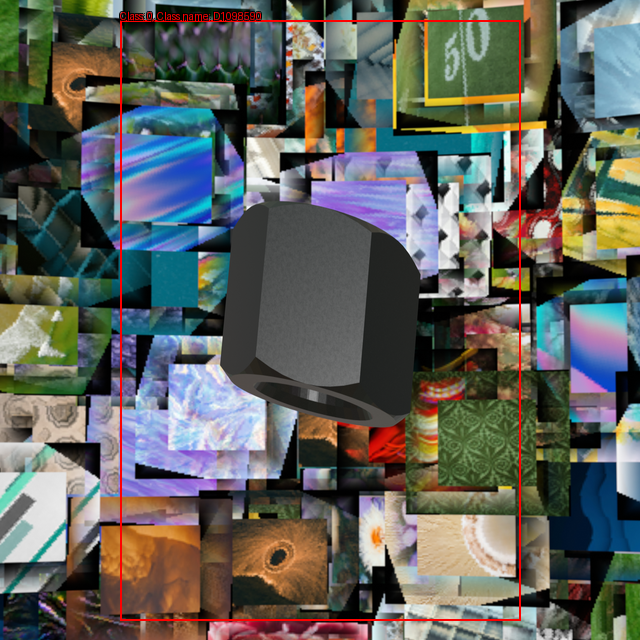

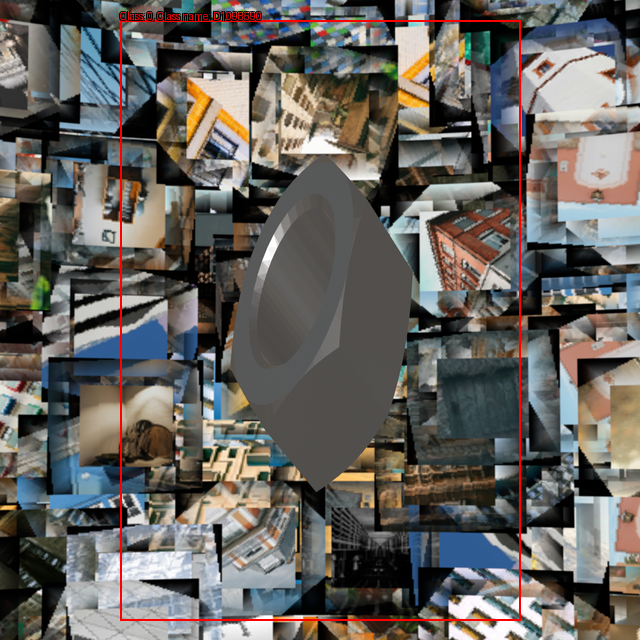

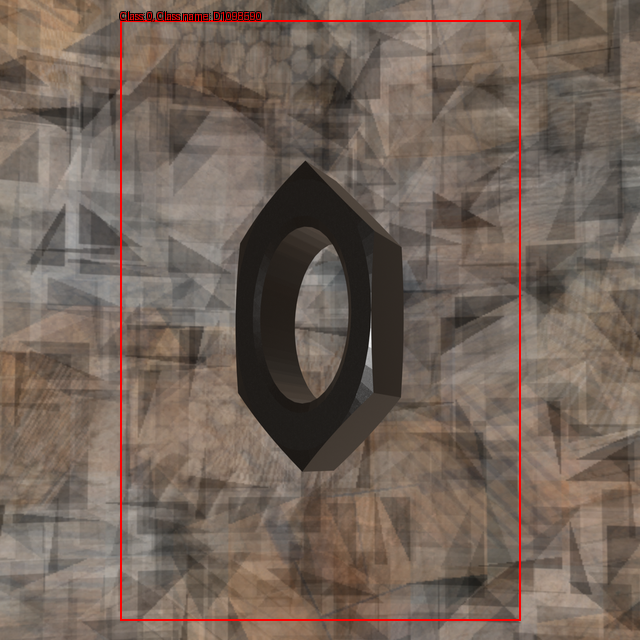

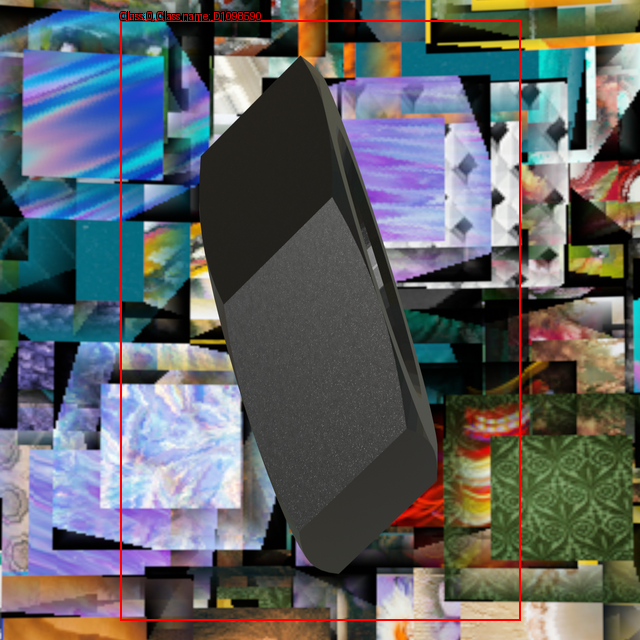

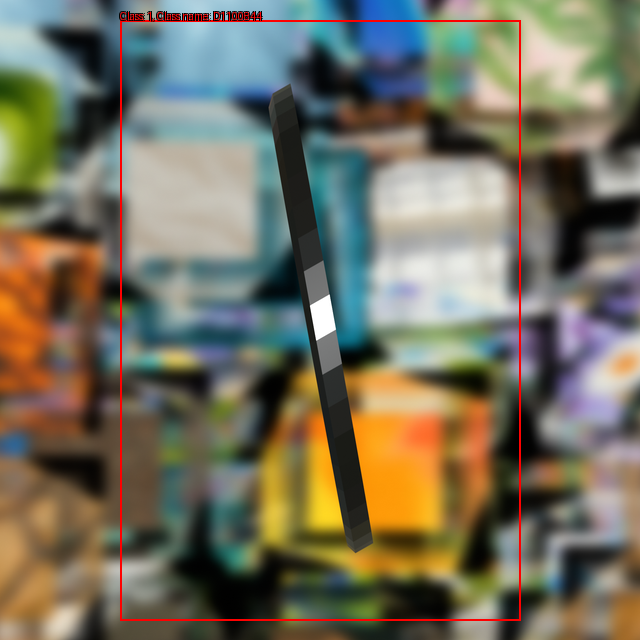

...

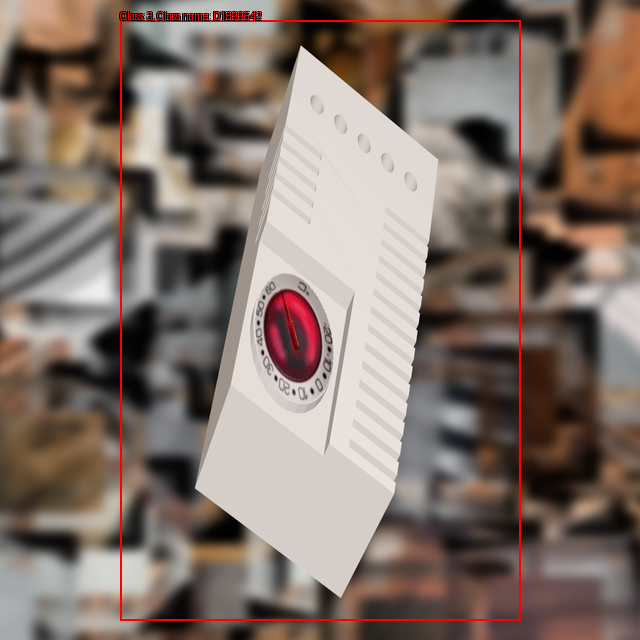

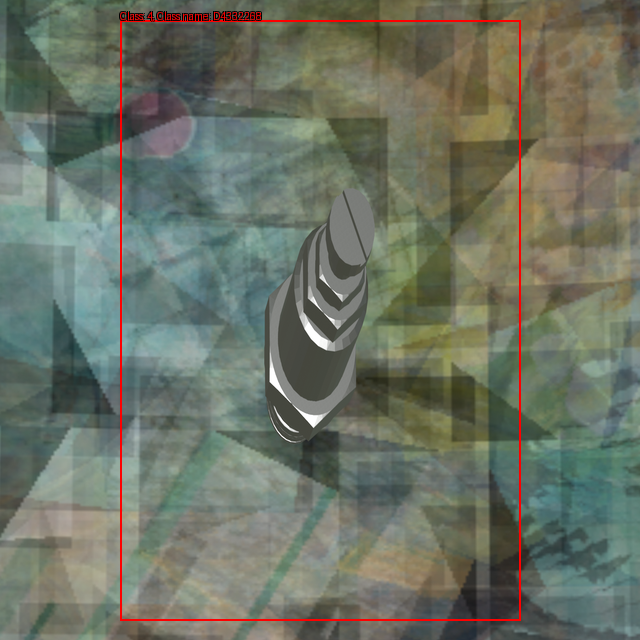

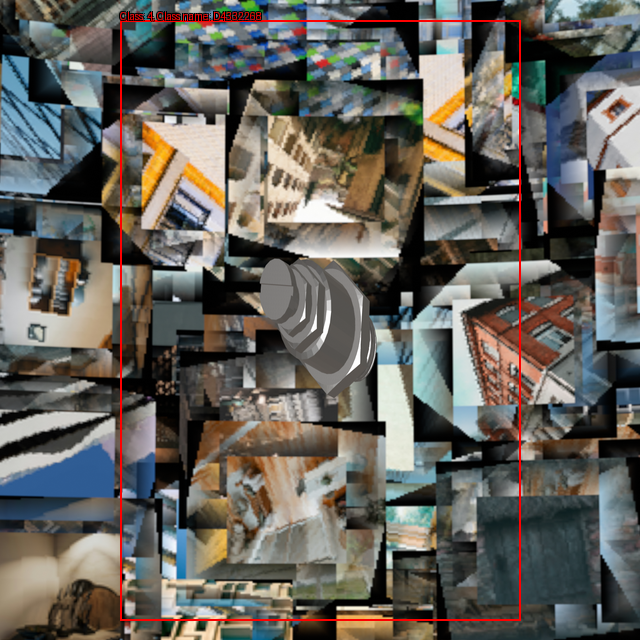

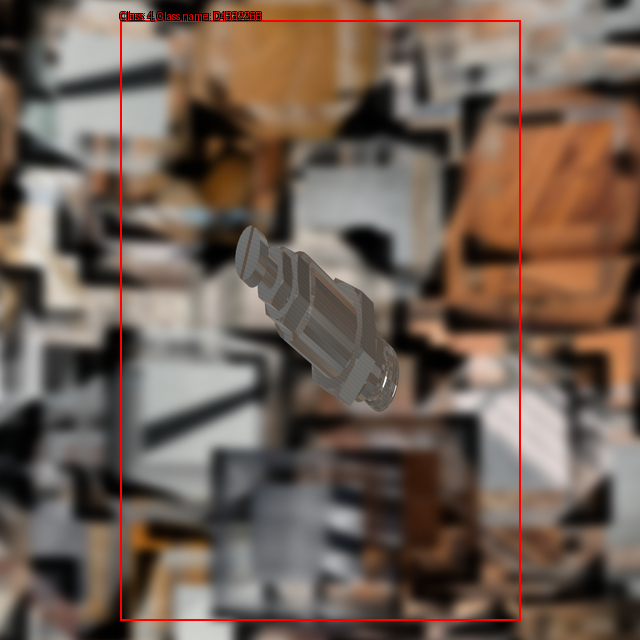

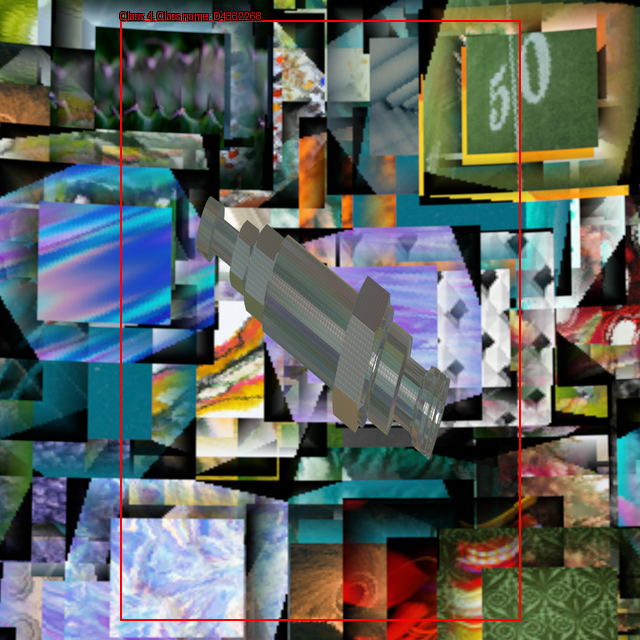

In [ ]:
import os
import random
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

def yolo_to_absolute(yolo_bbox, img_width, img_height):
    x_center, y_center, w, h = yolo_bbox
    x_center *= img_width
    y_center *= img_height
    w *= img_width
    h *= img_height
    return (int(x_center - w / 2), int(y_center - h / 2), int(x_center + w / 2), int(y_center + h / 2))

image_folder = '/content/Images'  # Replace with your image folder path
annotation_folder = '/content/Annotations'  # Replace with your annotation folder path
class_mapping = {
    'D1098590': 0,
    'D1100844': 1,
    'D1612695': 2,
    'D1899542': 3,
    'D4332268': 4,
}
reverse_class_mapping = {v: k for k, v in class_mapping.items()}
class_images = {class_id: [] for class_id in class_mapping.values()}

for image_file in os.listdir(image_folder):
    if image_file.endswith(('.png', '.jpg', '.jpeg')):
        class_id = class_mapping.get(image_file[:8])
        if class_id is not None:
            class_images[class_id].append(image_file)

selected_images = []
for class_id, images in class_images.items():
    selected_images.extend(random.sample(images, min(len(images), 4)))

def display_images(text_offset=-10):
    for image_file in selected_images:
        image_path = os.path.join(image_folder, image_file)
        annotation_file = os.path.splitext(image_file)[0] + '.txt'
        annotation_path = os.path.join(annotation_folder, annotation_file)

        with Image.open(image_path) as img:
            img_width, img_height = img.size
            draw = ImageDraw.Draw(img)
            font = ImageFont.load_default()  # Using default font

            if os.path.isfile(annotation_path):
                with open(annotation_path, 'r') as file:
                    for line in file:
                        class_id, x_center, y_center, width, height = map(float, line.split())
                        bbox = yolo_to_absolute((x_center, y_center, width, height), img_width, img_height)
                        draw.rectangle(bbox, outline="red", width=2)
                        class_name = reverse_class_mapping.get(int(class_id))
                        text = f"Class: {int(class_id)}, Class name: {class_name}"
                        text_x1 = bbox[0]
                        text_y1 = bbox[1] + text_offset  # Adjust text position based on offset

                        if text_y1 < 10 or text_y1 > img_height - 20:  # Ensure text is within image bounds
                            text_y1 = bbox[3] + 5  # Move below the bbox if too high or too low
                        # Draw text multiple times for a bold effect
                        offsets = [(-1, -1), (1, -1), (-1, 1), (1, 1)]
                        for dx, dy in offsets:
                            draw.text((text_x1 + dx, text_y1 + dy), text, fill="black", font=font)
                        draw.text((text_x1, text_y1), text, fill="red", font=font)

            display(img)

# Example usage
display_images(text_offset=-10)  # You can adjust 'text_offset' as needed

# **DOWNLOAD ANNOTATION FILES:**

In [ ]:
# ZIP AND DOWNLOAD:

import os
import zipfile
from google.colab import files

def zip_folder(folder_path, output_path):
    with zipfile.ZipFile(output_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), os.path.join(folder_path, '..')))

folder_path = "/content/Annotations"  # Change this to your folder path
output_zip_path = '/content/HIGH_COMPLEXITY_Annotations.zip'  # Output zip file name and path

zip_folder(folder_path, output_zip_path)
files.download(output_zip_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>